## Загрузите данные и изучите общую информацию

In [1]:
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
def total_info(data):
    print('Ознакомление с датафреймом')
    print('')
    
    
    display(data.head())
    print('Получены первые 5 строк датафрейма')
    print('')
    
    size = 'Общее количество столбцов в датафрейме: {cols} Количество строк в датафрейме {rows}'
    size = size.format(cols = data.shape[1], rows = data.shape[0])
    print(size)
    print('')
    
    print(data.info())
    print('Получена основная информация о датафрейме')
    print('')
    
    missing_counts = data.isnull().sum()
    missing_percentage = round((data.isnull().sum() / len(data)) * 100,2)
    result_df = pd.DataFrame({'Количество пропусков': missing_counts, 'Процент пропусков': missing_percentage})
    result_df.index.name = 'Название столбца'
    result_df = result_df[result_df['Количество пропусков'] > 0]
    print('Датафрейм со столбцами, содержащими пропуски:')
    display(result_df.reset_index())
    print('')
    
    duplicated = 'Количество полностью дублирующихся строк: {duplicate} \nВ процентах {percent}'
    duplicated = duplicated.format(duplicate = data.duplicated().sum(),\
                                   percent = round(data.duplicated().sum() / data.shape[0] * 100,3))
    print(duplicated)

    
    

In [4]:
total_info(df)

Ознакомление с датафреймом



,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Получены первые 5 строк датафрейма

Общее количество столбцов в датафрейме: 14 Количество строк в датафрейме 8406

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: fl

,Название столбца,Количество пропусков,Процент пропусков
0,hours,536,6.38
1,price,5091,60.56
2,avg_bill,4590,54.60
3,middle_avg_bill,5257,62.54
4,middle_coffee_cup,7871,93.64
5,seats,3611,42.96



Количество полностью дублирующихся строк: 0 
В процентах 0.0


In [5]:
unique_companies = 'Число уникальных комнаний в представленных данных: {}'
unique_companies = unique_companies.format(df['name'].nunique())
print(unique_companies)

Число уникальных комнаний в представленных данных: 5614


In [6]:
df['name'].value_counts().head()

Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
Name: name, dtype: int64

Компании с наибольшим количеством филиалов

**Выводы после онбординга:**
    
    - Датафрейм состоит из 14 столбцов и 8406 строк
    - В столбцах hours, price,avg_bill, middle_avg_bill, middle_coffee_cup, seats присутствуют пропуски
    - Значения столбцов chain,seats не соотсветсвует содержащимся типам данных, однако, из-за наличия NaN и отсутствия влияния на дальнейший анализ принято решение оставить столбцы без изменений
    - Явные дубликаты отсутствуют


## Выполните предобработку данных

### Корректировка типов данных столбцов

Не требуется

### Проверка неявных дубликатов

In [7]:
df.category.unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [8]:
dupl_check = df.applymap(lambda x: x.lower() if isinstance(x, str) else x)

dupl_check = df.applymap(lambda x: x.strip() if isinstance(x, str) else x)

#dupl_check['name'] = dupl_check['name'].apply(lambda x: ''.join(x.split()))

duplicates = dupl_check.duplicated()


if duplicates.any():
    duplicated_rows = dupl_check[duplicates]
    print("Найдены неявные дубликаты:")
    print(duplicated_rows)
else:
    print("Не найдено неявных дубликатов.")

Не найдено неявных дубликатов.


После приведения значений столбцов к общему формату (нижний регистр и удаление пробелов) неявных дубликатов не выявлено

### Работа с пропусками

In [9]:
columns_with_null = []
for i in df:
    if df[i].isna().sum() > 1:
        columns_with_null.append(i)
print(columns_with_null)

['hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats']


Получаем список со столбцами в которых есть пропущенные значения

<a id="my_anchor"></a>

In [10]:
for i in columns_with_null:
    col_null = 'Процент пропусков в столбце {i} составляет {percent:.2f}%'
    col_null = col_null.format(i = i,percent = df[i].isna().sum() / df.shape[0] * 100) 
    print(col_null)

Процент пропусков в столбце hours составляет 6.38%
Процент пропусков в столбце price составляет 60.56%
Процент пропусков в столбце avg_bill составляет 54.60%
Процент пропусков в столбце middle_avg_bill составляет 62.54%
Процент пропусков в столбце middle_coffee_cup составляет 93.64%
Процент пропусков в столбце seats составляет 42.96%


In [11]:
df['hours'].value_counts()

ежедневно, 10:00–22:00                                  759
ежедневно, круглосуточно                                730
ежедневно, 11:00–23:00                                  396
ежедневно, 10:00–23:00                                  310
ежедневно, 12:00–00:00                                  254
                                                       ... 
ежедневно, 07:00–01:00                                    1
пн-пт 10:00–16:30                                         1
пн-пт 08:00–20:00; сб 09:00–15:00                         1
пн-пт 08:00–19:00; сб 08:00–18:30                         1
вт-чт 10:00–20:30; пт,сб 10:00–21:30; вс 10:00–20:30      1
Name: hours, Length: 1307, dtype: int64

In [12]:
df['hours'] = df['hours'].fillna('Часы работы не указаны')

- В столбцах price, avg_bill, middle_avg_bill, middle_coffee_cup, seats пропущенны значения(>50% данных) по причине отсутсвия информации и замена одной из мер центральной тенденции некорректно.
- В стобце hours пропущено только 6% данных, однако тут лучше произвести замену пропусков на 'Часы работы не указаны' , чтобы это не повлияло при использовании данных из этого столбца далее

### Добавление новых столбцов 

In [15]:
df.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
4584,китайская грамота,"бар,паб","москва, улица сретенка, 1",Центральный административный округ,"ежедневно, 12:00–00:00",55.766683,37.630535,4.5,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,155.0
466,шах-даг,"бар,паб","москва, талдомская улица, 13",Северный административный округ,"ежедневно, 12:00–02:00",55.873123,37.520527,4.3,выше среднего,Средний счёт:от 1500 ₽,1500.0,NaN,0,105.0
7455,суши пати,пиццерия,"москва, улица перерва, 45",Юго-Восточный административный округ,"ежедневно, 11:00–23:30",55.659896,37.748385,4.1,средние,NaN,NaN,NaN,0,NaN
6905,илек-илек,кафе,"москва, чертановская улица, 1г",Южный административный округ,"ежедневно, 10:00–02:00",55.639980,37.606255,4.3,NaN,NaN,NaN,NaN,0,60.0
2414,кофе,кафе,"москва, зубарев переулок, 15, корп. 1",Северо-Восточный административный округ,пн-пт 09:00–18:00,55.811623,37.642513,3.8,NaN,NaN,NaN,NaN,1,47.0
6994,столовая,столовая,"москва, улица обручева, 34/63с2",Юго-Западный административный округ,пн-пт 09:00–17:00,55.654590,37.540687,4.0,средние,Средний счёт:250–350 ₽,300.0,NaN,0,NaN
7670,шоколадница,кофейня,"москва, профсоюзная улица, 129а",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.619023,37.506517,4.1,NaN,NaN,NaN,NaN,1,180.0
8299,шашлычный рай,кафе,"москва, юго-восточный административный округ, ...",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.721304,37.733848,4.1,NaN,NaN,NaN,NaN,0,NaN
5802,империя,кафе,"москва, улица мжд киевское 5-й км, 1, стр. 1",Западный административный округ,пн-пт 08:00–20:00,55.724033,37.505045,4.6,NaN,NaN,NaN,NaN,1,NaN
6712,vse-em,кафе,"москва, профсоюзная улица, 126, корп. 2",Юго-Западный административный округ,"ежедневно, 11:00–23:00",55.631778,37.517619,4.2,NaN,NaN,NaN,NaN,1,170.0


Видно, что название улицы указано всегда после названия города, можно с помощью лямбда функции рассплитить на элементы и вернуть в новый столбец элемент с индексом 1

In [16]:
df['street'] = df['address'].apply(lambda x: x.split(', ')[1])
df['street'].sample(10)

7046              улица намёткина
4861           улица земляной вал
2981             тагильская улица
8030         холодильный переулок
3189         кутузовский проспект
4375    нижний сусальный переулок
7815              луганская улица
2011              улица фонвизина
4654               улица покровка
6761          улица островитянова
Name: street, dtype: object

In [17]:
df['street'].nunique()

1447

**Создан столбец, содержащий информацию об улице из адреса места расположения филиала компании**

In [19]:
df['is_24_7'] = [True if 'ежедневно, круглосуточно' in hours else False for hours in df['hours']]

In [20]:
df.query('is_24_7 == True') 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
10,great room bar,"бар,паб","москва, левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0,левобережная улица,True
17,чайхана беш-бармак,ресторан,"москва, ленинградское шоссе, 71б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,ленинградское шоссе,True
19,пекарня,булочная,"москва, ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,ижорский проезд,True
24,drive café,кафе,"москва, улица дыбенко, 9ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,True
49,2u-ту-ю,пиццерия,"москва, ижорская улица, 8а",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,0,NaN,ижорская улица,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8394,намангале,кафе,"москва, ферганская улица, вл17-21",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.705332,37.819244,4.3,NaN,NaN,NaN,NaN,0,NaN,ферганская улица,True
8399,"пекарня, кафе-гриль",булочная,"москва, болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,0,50.0,болотниковская улица,True
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True


In [21]:
df['is_24_7'].value_counts()

False    7676
True      730
Name: is_24_7, dtype: int64

**730 Круглосуточных заведения**. Остальные 7676 - некруглосуточные (32 из которых открыты практически круглосуточно, но все равно причислены к этой группе)

- Произведена замена пропусков в требуемых столбцах
- Выполнена проверка на наличие явных и неявных дубликатов
- Добавлены новые столбцы
- Выявлено отсутствие необходимости типов данных в столбцах

## Анализ данных

### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [22]:
places_category = df.groupby('category', as_index = False).agg({'name':'count'}).sort_values(by = 'name', ascending = False).rename(columns = {'category':'Категория','name':'Количество заведений'}).reset_index(drop=True)
places_category

,Категория,Количество заведений
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


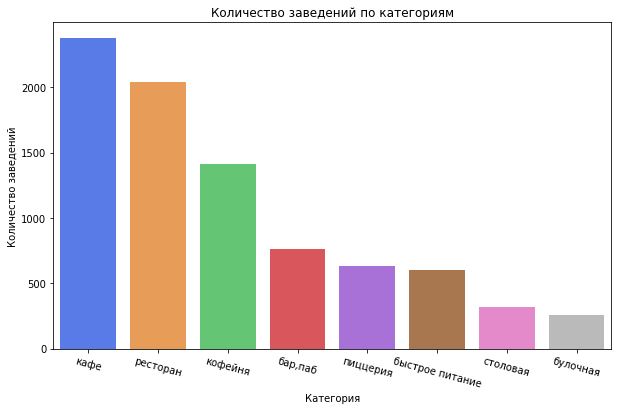

In [23]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Категория', y='Количество заведений', data=places_category, palette='bright', alpha = 0.75)
plt.title('Количество заведений по категориям')
plt.xticks(rotation=-15)
plt.show()

- В лидеры по количеству заведений попадают категории: **кафе** (2378),**ресторан** (2043),**кофейня** (1413)
- Меньше всего заведений, попадающих под категории столовая (315) и булочная (256)

### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [24]:
seats_places = df.groupby('category', as_index = False).agg({'seats': ['sum', 'median']})
seats_places. columns = ['Категория','Общее количество посадочных мест','Медианное количество']
seats_places = seats_places.sort_values(by = 'Медианное количество', ascending = False)
seats_places

,Категория,Общее количество посадочных мест,Медианное количество
6,ресторан,154869.0,86.0
0,"бар,паб",58281.0,82.5
4,кофейня,83511.0,80.0
7,столовая,16359.0,75.5
2,быстрое питание,34513.0,65.0
3,кафе,118770.0,60.0
5,пиццерия,40350.0,55.0
1,булочная,13229.0,50.0


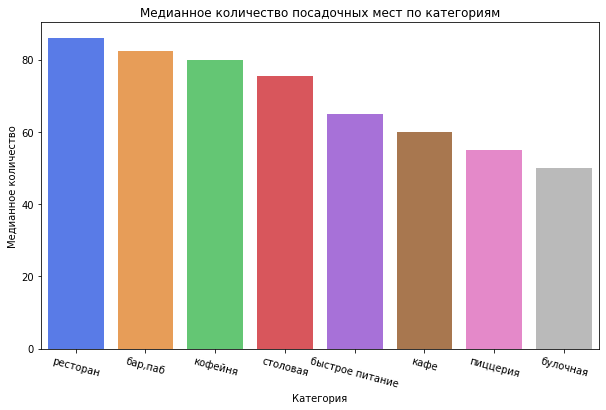

In [25]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Категория', y='Медианное количество', data=seats_places, palette='bright', alpha = 0.75)
plt.title('Медианное количество посадочных мест по категориям')
plt.xticks(rotation=-15)
plt.show()

- Наибольшее суммарное количество посадочных мест у заведений категории ресторан
- В медианном значении больше всего мест так же у категории ресторан
- Меньшим суммарным количеством мест обладают булочные

### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [26]:
chain_places = df.groupby('chain',as_index = False).agg({'name':'count'}).sort_values(by = 'name', ascending = False).rename(columns = {'chain':'Сеть','name':'Количество'}).reset_index(drop=True)
replace_dict = {1: 'Сетевые', 0: 'Несетевые'}
chain_places['Сеть'] = chain_places['Сеть'].replace(replace_dict)
chain_places

,Сеть,Количество
0,Несетевые,5201
1,Сетевые,3205


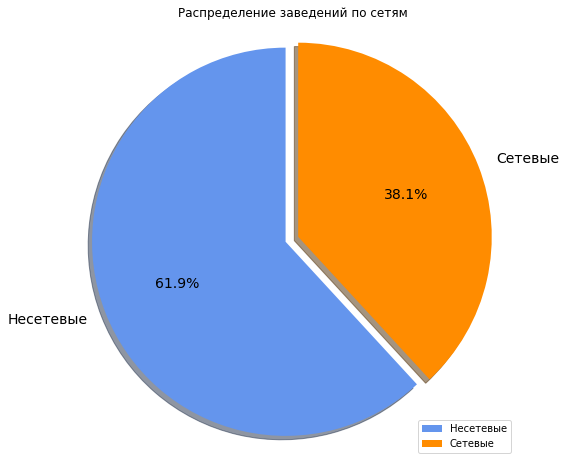

In [27]:
labels = chain_places['Сеть']
sizes = chain_places['Количество']
colors = ['cornflowerblue', 'darkorange'] 
explode = (0.07, 0)
plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors, explode=explode, shadow=True, textprops={'fontsize': 14})
plt.title('Распределение заведений по сетям')
plt.axis('equal')

# Добавляем легенду
plt.legend(loc='best')

plt.show()

- 61.9% мест являются несетевыми и 38.1% - сетевыми

### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [28]:
network_category = df.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
network_category.columns = ['Несетевые', 'Сетевые']
network_category.index.name = 'Категория'
network_category.reset_index(inplace=True)
network_category['Всего заведений'] = network_category.sum(axis = 1)
network_category['Доля сетевых мест'] = round(network_category['Сетевые'] / network_category['Всего заведений'],2)
network_category = network_category.sort_values(by = 'Доля сетевых мест',ascending = False)
network_category

,Категория,Несетевые,Сетевые,Всего заведений,Доля сетевых мест
1,булочная,99,157,256,0.61
5,пиццерия,303,330,633,0.52
4,кофейня,693,720,1413,0.51
2,быстрое питание,371,232,603,0.38
6,ресторан,1313,730,2043,0.36
3,кафе,1599,779,2378,0.33
7,столовая,227,88,315,0.28
0,"бар,паб",596,169,765,0.22


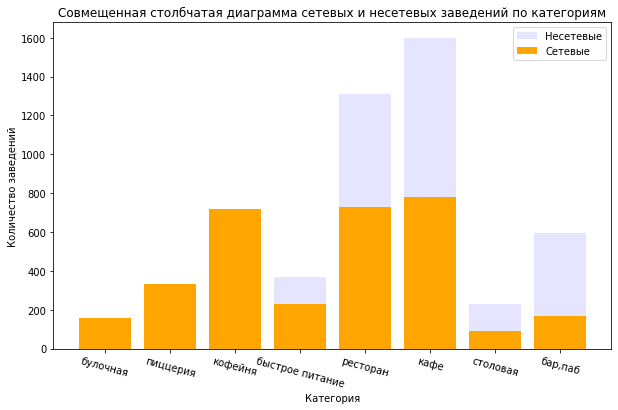

In [29]:
plt.figure(figsize=(10, 6))
plt.bar(network_category['Категория'], network_category['Несетевые'], color='blue', label='Несетевые',alpha = 0.1)
plt.bar(network_category['Категория'], network_category['Сетевые'], color='orange', label='Сетевые')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.title('Совмещенная столбчатая диаграмма сетевых и несетевых заведений по категориям')
plt.xticks(rotation=-15)
plt.legend()
plt.show()

- По таблице и графику визуализируется преобладание сетевых заведений в категориях: кафе, ресторан, кофейня

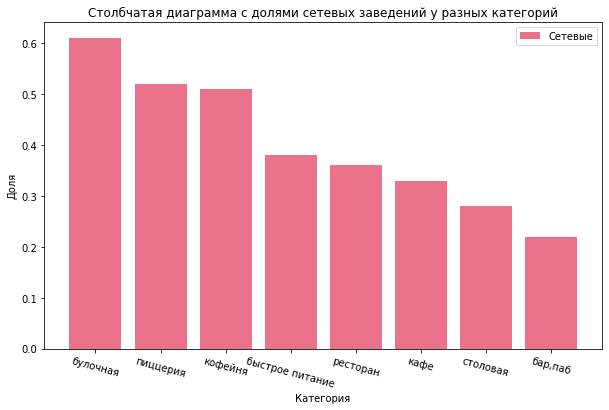

In [30]:
plt.figure(figsize=(10, 6))
plt.bar(network_category['Категория'], network_category['Доля сетевых мест'], color='crimson', label='Сетевые',alpha = 0.6)

plt.xlabel('Категория')
plt.ylabel('Доля')
plt.title('Столбчатая диаграмма с долями сетевых заведений у разных категорий')
plt.xticks(rotation=-15)
plt.legend()
plt.show()

Самая большая доля сетевых завведений у категорий **булочная, пиццерия и кофейня**, меньше всего у **кафе, столовой и бар.паб**

### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?



In [31]:
widespread = df.groupby('name').agg({'address':'count'}).sort_values(by = 'address',ascending = False).head(15).reset_index().rename(columns = {'name':'Название сети','address':'Количество заведений'})
widespread

,Название сети,Количество заведений
0,кафе,189
1,шоколадница,120
2,домино'с пицца,77
3,додо пицца,74
4,one price coffee,72
5,яндекс лавка,69
6,cofix,65
7,prime,50
8,хинкальная,44
9,шаурма,43


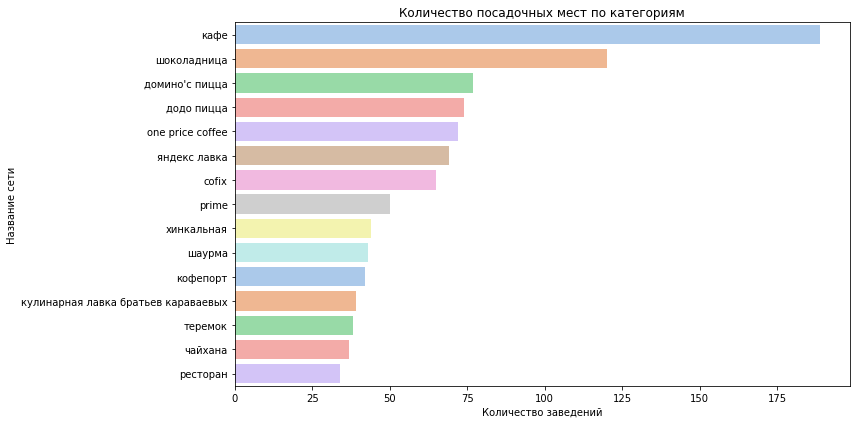

In [32]:
plt.figure(figsize=(12, 6))
sns.barplot(x='Количество заведений', y='Название сети', data=widespread, palette='pastel')
plt.title('Количество посадочных мест по категориям')
#plt.xticks(rotation=-45)
plt.tight_layout()
plt.show()

- На столбчатой диаграмме отображены 15 сетей с наибольшим количеством заведений

In [33]:
top_15_list = list(widespread['Название сети'].unique())
top_15_list # лист с названиями самых распространненых мест

['кафе',
 'шоколадница',
 "домино'с пицца",
 'додо пицца',
 'one price coffee',
 'яндекс лавка',
 'cofix',
 'prime',
 'хинкальная',
 'шаурма',
 'кофепорт',
 'кулинарная лавка братьев караваевых',
 'теремок',
 'чайхана',
 'ресторан']

In [34]:
filtered_df = df[df['name'].isin(top_15_list)]
unique_filtered_df = filtered_df.drop_duplicates(subset=['name']) # отбор уникальных названий заведений
for index, row in unique_filtered_df.iterrows():
    print(f"Заведение '{row['name']}' относится к категории '{row['category']}'")

Заведение 'додо пицца' относится к категории 'пиццерия'
Заведение 'домино'с пицца' относится к категории 'пиццерия'
Заведение 'кафе' относится к категории 'кафе'
Заведение 'шаурма' относится к категории 'быстрое питание'
Заведение 'cofix' относится к категории 'кофейня'
Заведение 'теремок' относится к категории 'ресторан'
Заведение 'чайхана' относится к категории 'кафе'
Заведение 'хинкальная' относится к категории 'быстрое питание'
Заведение 'one price coffee' относится к категории 'кофейня'
Заведение 'шоколадница' относится к категории 'кофейня'
Заведение 'яндекс лавка' относится к категории 'ресторан'
Заведение 'ресторан' относится к категории 'ресторан'
Заведение 'кофепорт' относится к категории 'кофейня'
Заведение 'prime' относится к категории 'ресторан'
Заведение 'кулинарная лавка братьев караваевых' относится к категории 'кафе'


- 15 самых больших сетей принадлежат к категориям: пиццерия, кафе, быстрое питание, ресторан, кофейня

### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [35]:
areas = df.pivot_table(index = ['district'],values = 'name' , columns = 'category', aggfunc = 'count').reset_index()
areas

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,53,25,71,272,105,72,160,40
1,Западный административный округ,50,37,62,239,150,71,218,24
2,Северный административный округ,68,39,58,235,193,77,189,41
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18
5,Центральный административный округ,364,50,87,464,428,113,670,66
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17
8,Южный административный округ,68,25,85,264,131,73,202,44


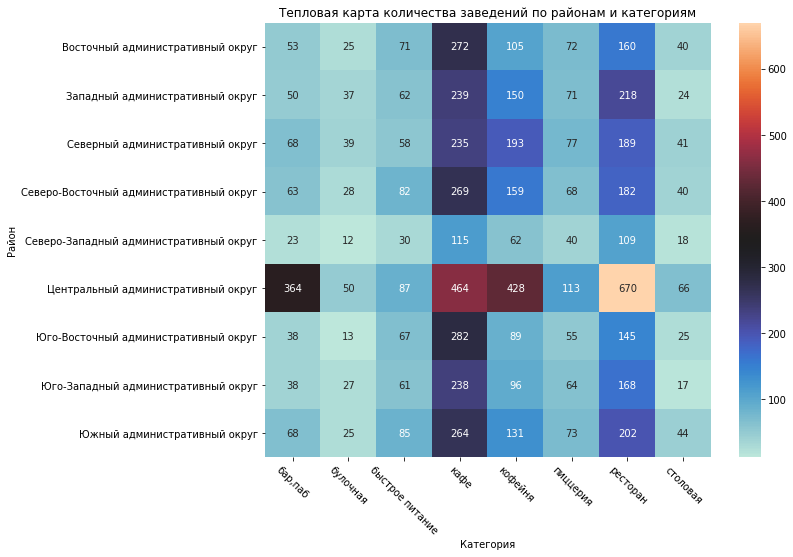

In [36]:
plt.figure(figsize=(10, 8))
sns.heatmap(areas.set_index('district'), cmap='icefire', annot=True, fmt='g')
plt.title('Тепловая карта количества заведений по районам и категориям')
plt.xlabel('Категория')
plt.ylabel('Район')
plt.xticks(rotation=-45)
plt.show()

На тепловой карте отображено количество заведений в разбивке по району и категории

In [37]:
areas['общее количество'] = areas.sum(axis = 1) 

Добавление к датафрейму с количеством заведений в разбивке по району и категории столбец с общим количеством заведений в районе. Визуализация с помощью библиотеки plotly

In [38]:
fig = go.Figure(data=go.Heatmap(
                   z=areas.values[:, 1:],
                   x=areas.columns[1:],
                   y=areas.iloc[:, 0],
                   text=areas.values[:, 1:],
                   hoverinfo='text'))

fig.update_layout(
    title='Тепловая карта распределения заведений по районам и категориям',
    xaxis=dict(title='Категория'),
    yaxis=dict(title='Район'),
    height=600,
    width=800
)

fig.show()

- Наибольшее количество заведений распологаются в ЦАО (в сумме и в разбивке по категориям)
- В ЦАО больше всего по районам заведений,относящихся к категории **ресторан**
- Наиболее часто встречающиеся во всех районах заведения относятся к категории **кафе**

### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [39]:
rating = df.groupby('category', as_index = False).agg({'rating':'mean'}).sort_values(by = 'rating',ascending = False).rename(columns = {'category':'Категория','rating':'Рейтинг'})
rating['Рейтинг'] = rating['Рейтинг'].apply(lambda x: round(x,2))
rating

,Категория,Рейтинг
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


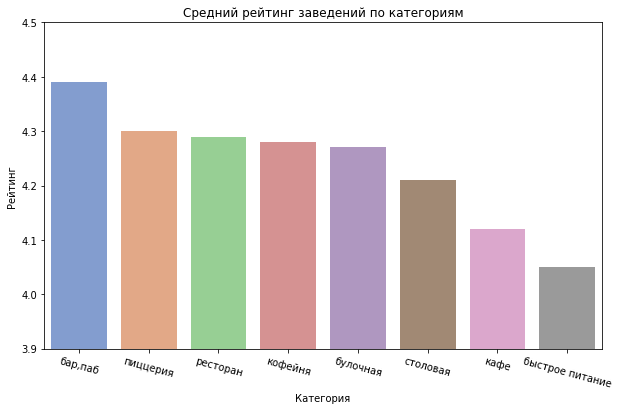

In [40]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Категория', y='Рейтинг', data=rating, palette='muted', alpha = 0.75)
plt.title('Средний рейтинг заведений по категориям')
plt.xticks(rotation=-15)
plt.gca().set_ylim(3.9, 4.5)
plt.show()

- Самый высокий средний рейтинг у категории бар,паб
- Самый низкий - быстрое питание

In [41]:
df['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Медианное значение и среднее значение практически одинаковые, что свидетельствует о небольшом количестве выбросов (низком количестве очень низких и очень высоких оценок)

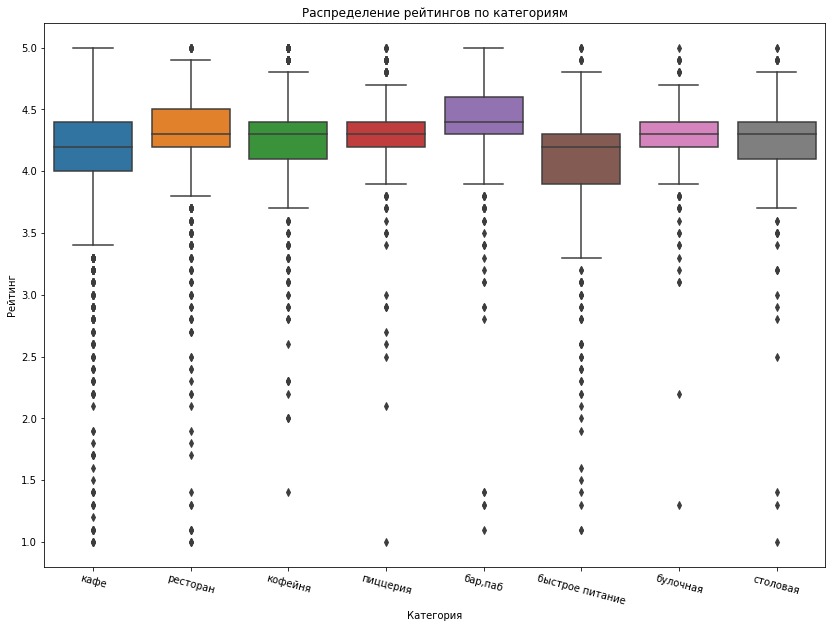

In [42]:
plt.figure(figsize=(14, 10))
sns.boxplot(x='category', y='rating', data=df)
plt.title('Распределение рейтингов по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.xticks(rotation=-15)
plt.show()

- На диаграмме размаха подтверждается небольшое количество выбросов у всех категорий
- У категорий кафе и быстрое питание самый большой межквартильный размах.

### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [43]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df['rating'] = round(rating_df['rating'],3)
rating_df

,district,rating
0,Восточный административный округ,4.174
1,Западный административный округ,4.182
2,Северный административный округ,4.240
3,Северо-Восточный административный округ,4.148
4,Северо-Западный административный округ,4.209
5,Центральный административный округ,4.378
6,Юго-Восточный административный округ,4.101
7,Юго-Западный административный округ,4.173
8,Южный административный округ,4.184


In [44]:
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

m

Построен хороплет, на котором отображены районы Москвы с медианным рейтингом. Самый высокий рейтинг у заведений в центре москвы. Наименьший - у СВАО и ЮВАО.

### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [45]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

m

На данной карте отображено расположение всех заведений, представленных в датасете. Наибольшее их количество располагается в ЦАО

### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [46]:
top_15_street = df.groupby('street').agg({'address':'count'}).sort_values(by = 'address',ascending = False).head(15).reset_index().rename(columns = {'name':'Название сети','address':'Количество заведений'})
top_15_street

,street,Количество заведений
0,проспект мира,184
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


Топ 15 улиц по количеству заведений: Больше всего заведений на проспекте Мира, Профсоюзной, проспекте Вернадского и Ленинском проспекте

In [47]:
top_15_street_list = list(top_15_street['street'])
top_15_street_list

['проспект мира',
 'профсоюзная улица',
 'проспект вернадского',
 'ленинский проспект',
 'ленинградский проспект',
 'дмитровское шоссе',
 'каширское шоссе',
 'варшавское шоссе',
 'ленинградское шоссе',
 'мкад',
 'люблинская улица',
 'улица вавилова',
 'кутузовский проспект',
 'улица миклухо-маклая',
 'пятницкая улица']

In [48]:
filtered_df_street = df[df['street'].isin(top_15_street_list)] # датафрейм включающий данные только по топ-15 улиц

In [49]:
filtered_df_street = filtered_df_street.pivot_table(index = ['street'],values = 'name' , columns = 'category', aggfunc = 'count').reset_index()
filtered_df_street = filtered_df_street.fillna(0)
filtered_df_street

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,варшавское шоссе,6.0,0.0,7.0,18.0,14.0,4.0,20.0,7.0
1,дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
2,каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0
3,кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
4,ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
5,ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
6,ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
7,люблинская улица,5.0,0.0,5.0,26.0,11.0,1.0,10.0,2.0
8,мкад,1.0,0.0,9.0,45.0,4.0,0.0,5.0,1.0
9,проспект вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0


In [50]:
filtered_df_street['всего'] = filtered_df_street.sum(axis = 1) 

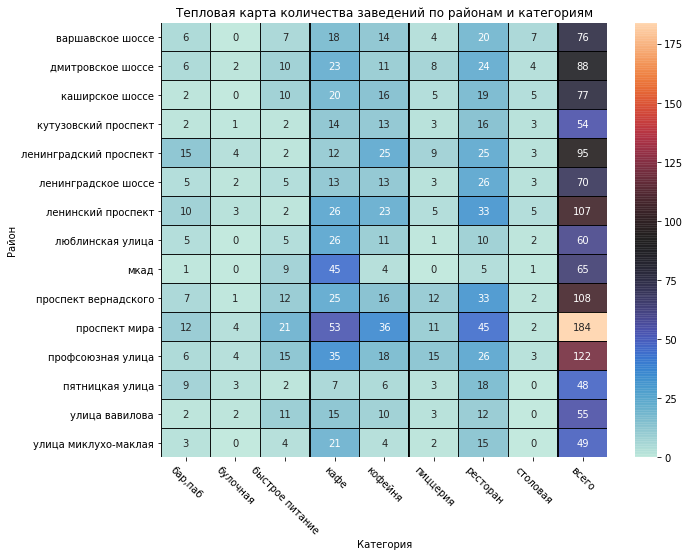

In [51]:
plt.figure(figsize=(10, 8))
sns.heatmap(filtered_df_street.set_index('street'), cmap='icefire', annot=True, fmt='g', linewidths=0.5, linecolor='black', alpha=0.9)
plt.title('Тепловая карта количества заведений по районам и категориям')
plt.xlabel('Категория')
plt.ylabel('Район')
plt.xticks(rotation=-45)
plt.show()

- На данной тепловой карте визуализируются топ 15 улиц с наибольшим количеством заведений, в разбивке по категории
- В лидерах **проспект Мира**, наибольшее количество заведений на этой улице принадлежит категории кафе и ресторан
- Второе место поделили **проспект Вернадского** и **Ленинградский проспект**, наибольшее количество заведений которых так же относятся к категориям кафе и ресторан

### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [52]:
fast_food_one = df.groupby('street', as_index = False).agg({'address':'count'}).query('address == 1')
fast_food_one_list = list(fast_food_one['street'])
print('Получен список улиц,на которых только один объект общепита, количество таких улиц:', len(fast_food_one_list) )

Получен список улиц,на которых только один объект общепита, количество таких улиц: 457


In [53]:
street_with_one_object = df[df['street'].isin(fast_food_one_list)]
street_with_one_object = street_with_one_object.groupby('category')['street'].nunique().reset_index().rename(columns ={'category':'Категория','street':'Количество улиц'}).sort_values(by = 'Количество улиц', ascending = False)
display(street_with_one_object)

,Категория,Количество улиц
3,кафе,159
6,ресторан,93
4,кофейня,84
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


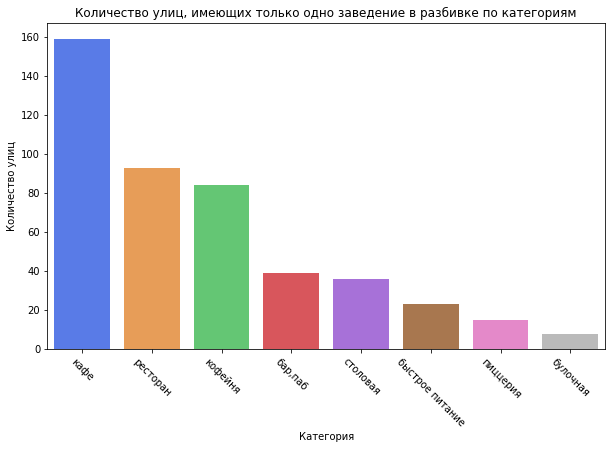

In [54]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Категория', y='Количество улиц', data=street_with_one_object, palette='bright', alpha = 0.75)
plt.title('Количество улиц, имеющих только одно заведение в разбивке по категориям')
plt.xticks(rotation=-45)
plt.show()

- На данной столбчатой диаграмме представлено количество улиц, имеющих только одно заведение по разбивке по категориям, к которым оно принадджежит
- 160 улиц, которые имеют только 1 заведение, которое относится к категории **кафе**
- 93 улицы, которые имеют только 1 заведение, которое относится к категории **ресторан**
- 84 улицы, которые имеют только 1 заведение, которое относится к категории **кофейня**


### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [55]:
rating_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values(by = 'middle_avg_bill',ascending = False)
rating_df

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [56]:
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=5, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

m

На данном хороплете отображен размер медианного среднего чека заведений по районам. Самый высокий медианный показатель у ЦАО и ЗАО

### Соберите наблюдения по вопросам выше в один общий вывод.

- В лидеры по количеству заведений попадают категории: **кафе** (2378),**ресторан** (2043),**кофейня** (1413)
- Наибольшее суммарное, а так же медианное количество  посадочных мест у заведений категории **ресторан**. Меньшим суммарным количеством мест обладают булочные
- 61.9% мест являются несетевыми и 38.1% - сетевыми
- Сетевых заведения чаще всего принадлежат к категориям: **кафе, ресторан, кофейня**
- Самая большая доля сетевых завведений у категорий булочная, пиццерия и кофейня, меньше всего у кафе, столовой и бар.паб
- 15 самых больших сетей принадлежат к категориям: пиццерия, кафе, быстрое питание, ресторан, кофейня
- В ЦАО больше всего заведений в разбивке по районам,относящихся к категории **ресторан**. Наиболее часто встречающиеся во всех районах заведения относятся к категории **кафе**
- Самый высокий средний рейтинг у категории **бар,паб**. Самый низкий - быстрое питание
- Самый высокий рейтинг у заведений в **центре москвы**. Наименьший - у СВАО и ЮВАО.
- Наибольшее их заведений располагается в **ЦАО** 
- Среди улиц с самым большим количество заведений лидерами стали **проспект Мира** ,**проспект Вернадского** и **Ленинградский проспект**. Чаще всего заведения  принадлежат к категории кафе и ресторан
- Самыми популярными категориями, среди улиц, иммеющих только 1 заведение, стали категории **кафе,ресторан,кофейня**
- На хороплете медианного среднего чека по районам Москвы, районами с самым высоким показателем стали **ЦАО** и **ЗАО**

## Детализируем исследование: открытие кофейни

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [57]:
coffee_place = 'Количество кофеен в изучаемых данных - {}'
coffee_place = coffee_place.format(df.query('category == "кофейня"').shape[0])
print(coffee_place)

Количество кофеен в изучаемых данных - 1413


In [58]:
coffee_place_in_districts = df.query('category == "кофейня"').groupby('district',as_index = False).agg({'address':'count'}).sort_values(by = 'address',ascending = False).rename(columns = {'district':'Район','address':'Количество кофеен'})
coffee_place_in_districts

,Район,Количество кофеен
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


- В центре москвы наибольшее количетсво кофеен (428)
- Далее Следуюет САО и СВАО,ЗАО
- Меньше всего кофеен в ЮЗАО, ЮВАО, СЗАО (62)

### Есть ли круглосуточные кофейни?

In [59]:
coffee_shop_24 = df.query('(category == "кофейня") & (is_24_7 == True)')
print('Количество круглосуточных кофеен:' ,coffee_shop_24.shape[0])

Количество круглосуточных кофеен: 59


### Какие у кофеен рейтинги? Как они распределяются по районам?

In [60]:
coffee_place_rating = df.query('category == "кофейня"')

In [61]:
coffee_place_rating_mean = coffee_place_rating.groupby('district', as_index = False).agg({'rating':'mean'})
coffee_place_rating_mean

,district,rating
0,Восточный административный округ,4.282857
1,Западный административный округ,4.195333
2,Северный административный округ,4.291710
3,Северо-Восточный административный округ,4.216981
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336449
6,Юго-Восточный административный округ,4.225843
7,Юго-Западный административный округ,4.283333
8,Южный административный округ,4.232824


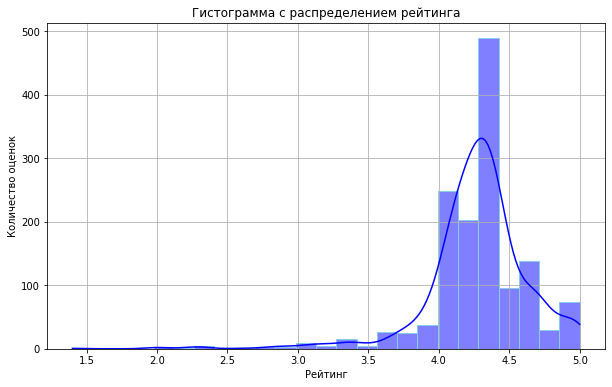

In [62]:
plt.figure(figsize=(10, 6))
sns.histplot(coffee_place_rating['rating'], bins=25, kde=True, edgecolor="skyblue", color="blue")
plt.title('Гистограмма с распределением рейтинга')
plt.xlabel('Рейтинг')
plt.ylabel('Количество оценок')
plt.grid(True)
plt.show() 

На гистограмме отображен наиболее частовстречающийся средний рейтинг и количество оценок. Очень редко кофейни получают оценку ниже 4 и нечасто - оценку более 4.5

In [63]:
df.district.unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [64]:
mapping = {
    'Северный административный округ': 'САО',
    'Северо-Восточный административный округ': 'СВАО',
    'Северо-Западный административный округ': 'СЗАО',
    'Западный административный округ': 'ЗАО',
    'Центральный административный округ': 'ЦАО',
    'Восточный административный округ': 'ВАО',
    'Юго-Восточный административный округ': 'ЮВАО',
    'Южный административный округ': 'ЮАО',
    'Юго-Западный административный округ': 'ЮЗАО'
}

coffee_place_rating_mean['district'] = coffee_place_rating_mean['district'].replace(mapping)

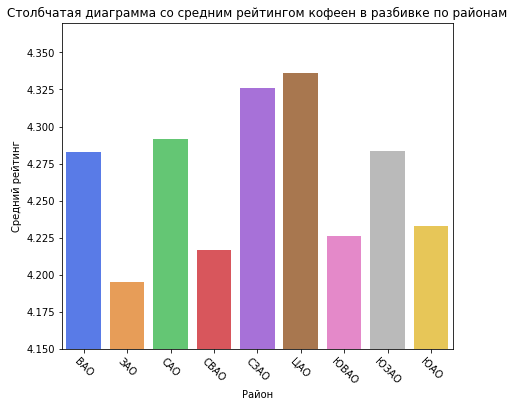

In [65]:
plt.figure(figsize=(7, 6))
sns.barplot(x='district', y='rating', data=coffee_place_rating_mean, palette='bright', alpha = 0.75)
plt.title('Столбчатая диаграмма со средним рейтингом кофеен в разбивке по районам')
plt.ylabel('Средний рейтинг')
plt.xlabel('Район')
plt.gca().set_ylim(4.15, 4.37)
plt.xticks(rotation=-45)
plt.show()

- В среднем самый высокий рейтинг заведений категории кофейня наблюдается в районах ЦАО, СЗАО
- Самый низкий в ЗАО

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [66]:
df['middle_coffee_cup'].describe() # цена на чашку кофе среди всех категорий

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [67]:
coffee_place_rating['middle_coffee_cup'].describe() # цена на чашку кофе только среди заведений категории кофейня

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [68]:
quantile_1 = df['middle_coffee_cup'].quantile(0.25)
quantile_3 = df['middle_coffee_cup'].quantile(0.75)
IQR = quantile_3 - quantile_1 

lower_bound = quantile_1 - 1.5 * IQR
upper_bound = quantile_3 + 1.5 * IQR

df_true_coffee_bill = df[(df['middle_coffee_cup'] >= lower_bound) & (df['middle_coffee_cup'] <= upper_bound)]
print(df_true_coffee_bill['middle_coffee_cup'].describe())
print('')
print('Медианная цена на чашку кофе:', int(df_true_coffee_bill['middle_coffee_cup'].describe()[1]), 'руб.')
print('Средняя цена на чашку кофе:', int(df_true_coffee_bill['middle_coffee_cup'].describe()[5]),'руб.')

count    534.000000
mean     172.112360
std       65.408333
min       60.000000
25%      124.250000
50%      168.000000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

Медианная цена на чашку кофе: 172 руб.
Средняя цена на чашку кофе: 168 руб.


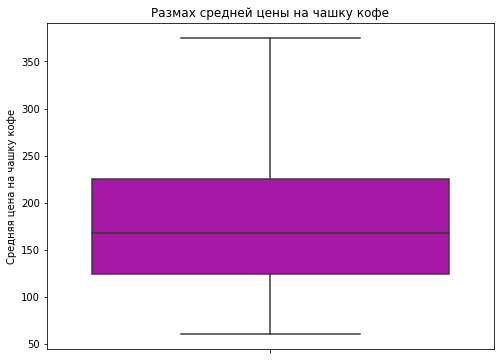

In [69]:
plt.figure(figsize=(8, 6))
df_true = df.query('middle_coffee_cup < 1500') # удаляем выброс (1 чашка кофе цена которой нарушает анализ)
sns.boxplot(data=df_true, y='middle_coffee_cup', color = 'm')
plt.title('Размах средней цены на чашку кофе')
plt.ylabel('Средняя цена на чашку кофе')
plt.show()

Межквартильный размах: от 124 до 225 руб


- Из-за большого количества <a href="#my_anchor">пропусков</a> в столбце со средней ценой на чашку кофе, не стоит ориентироваться только на этот показатель. Однако, средняя цена составляет 172руб, а медианная - 168руб.
- Так же по представленным данным из-за преобладания пропусков нельзя посчитать корреляцию цены среднего чека и средней цены чашки кофе, а уж тем более определенного вида кофе (капучино)

In [70]:
print('Показатель корреляции между средней ценой на чашку кофе и')
print('количеством посадчных мест :', coffee_place_rating['seats'].corr(coffee_place_rating['middle_coffee_cup']))
print('показатель рейтинга заведения :', coffee_place_rating['rating'].corr(coffee_place_rating['middle_coffee_cup']))
print('круглосуточными часами работы :',coffee_place_rating['is_24_7'].corr(coffee_place_rating['middle_coffee_cup']))

Показатель корреляции между средней ценой на чашку кофе и
количеством посадчных мест : -0.03282478051439963
показатель рейтинга заведения : 0.09610195824565271
круглосуточными часами работы : 0.09730948889192631


По имеющимся данным, линейная связь между средней ценой на чашку кофе и количеством посадочных мест / рейтнгом / и круглосуточными часами работы отсутствует.

## Вывод и рекомендации

Основываясь на финансовых возможностях заказчика, доступности места под аренду 
заведения и нежелания столкнуться с конкуренцией можно выделить следующие 
пункты:
 - При наличии больших финансовых средств стоит открывать заведение категории 
кафе, ресторан, кофейня в ЦАО и ЗАО.  Это обеспечит наивысший среди остальных 
категорий и округов медианный чек, однако сопряжено с максимально высоким 
уровнем конкуренции
 -  При средних финансовых инвестициях рекомендовано открыть заведения категории 
бар.паб во всех районах Москвы, кроме ЮАО, ЮВАО, СВАО. 
 -  При желании избежать конкуренции и выборе улиц с минимальным количеством 
других заведений рекомендовано к открытию заведение категории кафе, ресторан, 
кофейня
 -  Ориентировочная цена за чашку кофе лежит в интервале от 124 до 225 руб

## Подготовка презентации

Презентация: https://drive.google.com/file/d/10_m6Q43EWUkySAA3-5mDCmuYdTomfiId/view?usp=sharing
